In [1]:
import pandas as pd

In [2]:
from IPython.display import display, HTML

def display_df(orders, height=300):
    """
    Displays a scrollable HTML table for a given Pandas DataFrame.
    
    Parameters:
    orders (pd.DataFrame): The DataFrame to display.
    height (int): The height of the scrollable div in pixels (default is 300).
    
    Returns:
    None: Displays the scrollable HTML table in a Jupyter Notebook or IPython environment.
    """
    # Convert DataFrame to HTML
    html_table = orders.to_html(classes='table table-striped', index=False)
    
    # Create scrollable div with the HTML table
    scrollable_html = f"""
    <div style="height:{height}px; overflow:auto;">
        {html_table}
    </div>
    """
    
    # Display the HTML
    display(HTML(scrollable_html))

## Retrieving Data Set
Source: https://archive.ics.uci.edu/dataset/352/online+retail

This is a transactional data set which contains all the transactions occurring between 
01/12/2010 and 09/12/2011 for a UK-based and registered non-store online retail.
The company mainly sells unique all-occasion gifts. Many customers of the company 
are wholesalers.

Variable Information:
| Variable Name | Role       | Type         | Description                                                                                      | Units    | Missing Values |
|---------------|------------|--------------|--------------------------------------------------------------------------------------------------|----------|----------------|
| InvoiceNo     | ID         | Categorical  | A 6-digit integral number uniquely assigned to each transaction. If this code starts with 'C', it indicates a cancellation. |          | No             |
| StockCode     | ID         | Categorical  | A 5-digit integral number uniquely assigned to each distinct product.                           |          | No             |
| Description   | Feature    | Categorical  | Product name.                                                                                   |          | Yes            |
| Quantity      | Feature    | Integer      | The quantities of each product (item) per transaction.                                          |          | No             |
| InvoiceDate   | Feature    | Date         | The day and time when each transaction was generated.                                           |          | No             |
| UnitPrice     | Feature    | Continuous   | Product price per unit.                                                                         | Sterling | No             |
| CustomerID    | Feature    | Categorical  | A 5-digit integral number uniquely assigned to each customer.                                   |          | Yes            |
| Country       | Feature    | Categorical  | The name of the country where each customer resides.                                            |          | No             |



In [3]:
# Import data
# MAC Path
orders = pd.read_excel("/Users/kentrickfelixkepawitono/Desktop/Cloud/Medium/RFM Analysis/Data/Online Retail.xlsx")
# Windows Path
#orders = pd.read_excel("C:\\Users\\kentr\\Qsync\\Medium\\RFM Analysis\\Data\\Online Retail.xlsx")


In [4]:
# Check data
orders.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   InvoiceNo    541909 non-null  object        
 1   StockCode    541909 non-null  object        
 2   Description  540455 non-null  object        
 3   Quantity     541909 non-null  int64         
 4   InvoiceDate  541909 non-null  datetime64[ns]
 5   UnitPrice    541909 non-null  float64       
 6   CustomerID   406829 non-null  float64       
 7   Country      541909 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(1), object(4)
memory usage: 33.1+ MB


In [5]:
# Total null values
orders.isnull().sum()

InvoiceNo           0
StockCode           0
Description      1454
Quantity            0
InvoiceDate         0
UnitPrice           0
CustomerID     135080
Country             0
dtype: int64

## Data Pre-processing
This process remove duplicates and adds some new variables from the existing variables. At the very end, we remove outliers using Isolation Forest Algorithm.

In [6]:
orders.isnull().sum()

InvoiceNo           0
StockCode           0
Description      1454
Quantity            0
InvoiceDate         0
UnitPrice           0
CustomerID     135080
Country             0
dtype: int64

In [7]:
# Total duplicated rows
print("Total Duplicated Rows:")
print(orders.duplicated().sum())

# Remove duplicate rows
orders_filtered = orders.drop_duplicates()

# Remove NA values
orders_filtered = orders_filtered.dropna()

# Exclude negative transactions (inventory adjustments, etc.)
orders_filtered = orders_filtered[(orders_filtered['Quantity'] > 0) & (orders_filtered['UnitPrice'] > 0)]

Total Duplicated Rows:
5268


In [8]:
orders_filtered.isnull().sum()

InvoiceNo      0
StockCode      0
Description    0
Quantity       0
InvoiceDate    0
UnitPrice      0
CustomerID     0
Country        0
dtype: int64

In [9]:
orders_filtered.describe()

,Quantity,InvoiceDate,UnitPrice,CustomerID
count,392692.000000,392692,392692.000000,392692.000000
mean,13.119702,2011-07-10 19:13:07.771892480,3.125914,15287.843865
min,1.000000,2010-12-01 08:26:00,0.001000,12346.000000
25%,2.000000,2011-04-07 11:12:00,1.250000,13955.000000
50%,6.000000,2011-07-31 12:02:00,1.950000,15150.000000
75%,12.000000,2011-10-20 12:53:00,3.750000,16791.000000
max,80995.000000,2011-12-09 12:50:00,8142.750000,18287.000000
std,180.492832,NaN,22.241836,1713.539549


In [10]:
# Add month, date, year, etc from Invoice Date
orders_filtered = orders_filtered.copy()

orders_filtered.loc[:, 'Dates'] = pd.to_datetime(orders_filtered['InvoiceDate']).dt.date #Get the date
orders_filtered.loc[:, 'Year'] = pd.to_datetime(orders_filtered['InvoiceDate']).dt.year #Get the year
orders_filtered.loc[:, 'Months'] = pd.to_datetime(orders_filtered['InvoiceDate']).dt.month #Get the month
orders_filtered.loc[:, 'Time_hour'] = pd.to_datetime(orders_filtered['InvoiceDate']).dt.hour #Get the hour

# Add total amount purchase
orders_filtered['TotalAmount'] = orders_filtered['Quantity'] * orders_filtered['UnitPrice']

# Segragate Purchase Time
def label_purchase_time(hour):
    if 6 <= hour < 12:
        return 'morning'
    elif 12 <= hour < 18:
        return 'afternoon'
    else:
        return 'evening'
    
orders_filtered['PurchaseTime'] = orders_filtered['InvoiceDate'].dt.hour.apply(label_purchase_time)

In [11]:
display_df(orders_filtered.head(10))

InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Dates,Year,Months,Time_hour,TotalAmount,PurchaseTime
536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,2010-12-01,2010,12,8,15.30,morning
536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,2010-12-01,2010,12,8,20.34,morning
536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,2010-12-01,2010,12,8,22.00,morning
536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,2010-12-01,2010,12,8,20.34,morning
536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,2010-12-01,2010,12,8,20.34,morning
536365,22752,SET 7 BABUSHKA NESTING BOXES,2,2010-12-01 08:26:00,7.65,17850.0,United Kingdom,2010-12-01,2010,12,8,15.30,morning
536365,21730,GLASS STAR FROSTED T-LIGHT HOLDER,6,2010-12-01 08:26:00,4.25,17850.0,United Kingdom,2010-12-01,2010,12,8,25.50,morning
536366,22633,HAND WARMER UNION JACK,6,2010-12-01 08:28:00,1.85,17850.0,United Kingdom,2010-12-01,2010,12,8,11.10,morning
536366,22632,HAND WARMER RED POLKA DOT,6,2010-12-01 08:28:00,1.85,17850.0,United Kingdom,2010-12-01,2010,12,8,11.10,morning
536367,84879,ASSORTED COLOUR BIRD ORNAMENT,32,2010-12-01 08:34:00,1.69,13047.0,United Kingdom,2010-12-01,2010,12,8,54.08,morning


In [12]:
# Performing Isolation Forest Algorithm
# Using 'Quantity' and 'TotalAmount' as the variables to detect outliers
from sklearn.ensemble import IsolationForest
import plotly.express as px

# Use 'Quantity' and 'TotalAmount' for outlier detection
X = orders_filtered[['Quantity', 'TotalAmount']].reset_index()

# Instantiate the Isolation Forest model
isolation_forest = IsolationForest(
    n_estimators=100,   # Number of trees
    contamination=0.01, # Proportion of outliers (e.g., 1%)
    random_state=42
)

# Fit the model
isolation_forest.fit(X)

# Predict anomalies (-1 for anomaly, 1 for normal)
# Use the same dataframe to avoid feature name mismatches
orders_filtered['Anomaly'] = isolation_forest.predict(X)

# Map anomaly labels to Yes/No
orders_filtered['Anomaly'] = orders_filtered['Anomaly'].map({-1: 'Yes', 1: 'No'})


In [13]:
# Custom color mapping for categories
color_map = {
    "Yes": "red",  # Category 'Yes' gets red
    "No": "blue"  # Category 'No' gets blue
}

# Plot with Plotly
fig = px.scatter(
    orders_filtered,
    x='Quantity',
    y='TotalAmount',
    color='Anomaly',
    color_discrete_map=color_map,
    title='Isolation Forest: Anomaly Detection',
    labels={'Quantity': 'Quantity', 'TotalAmount': 'Total Amount'},
)

# Update layout for better appearance
fig.update_layout(
    xaxis_title='Quantity',
    yaxis_title='Total Amount ($)',
    legend_title_text='Anomaly?',
    xaxis=dict(range=[orders_filtered['Quantity'].min(), 250]),  # Set x-axis range
    yaxis=dict(range=[orders_filtered['TotalAmount'].min(), 1000])  # Set y-axis range
)

# Show plot
fig.show()


In [14]:
orders_filtered_w_anomaly = orders_filtered.copy()

# Remove Anomaly
orders_filtered = orders_filtered[orders_filtered['Anomaly'] == 'No']

## RFM Analysis
This process gets the Recency, Frequency, and Monetary values of each customer. Then provide a scoring for each Recency, Frequency, and Monerary.

In [15]:
orders_filtered.info()

<class 'pandas.core.frame.DataFrame'>
Index: 388765 entries, 0 to 541908
Data columns (total 15 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   InvoiceNo     388765 non-null  object        
 1   StockCode     388765 non-null  object        
 2   Description   388765 non-null  object        
 3   Quantity      388765 non-null  int64         
 4   InvoiceDate   388765 non-null  datetime64[ns]
 5   UnitPrice     388765 non-null  float64       
 6   CustomerID    388765 non-null  float64       
 7   Country       388765 non-null  object        
 8   Dates         388765 non-null  object        
 9   Year          388765 non-null  int32         
 10  Months        388765 non-null  int32         
 11  Time_hour     388765 non-null  int32         
 12  TotalAmount   388765 non-null  float64       
 13  PurchaseTime  388765 non-null  object        
 14  Anomaly       388765 non-null  object        
dtypes: datetime64[ns](1), 

In [16]:
# Get the maximum date for the Recency
current_date = orders_filtered['InvoiceDate'].max()
current_date

Timestamp('2011-12-09 12:50:00')

In [17]:
# Conduct RFM
rfm = orders_filtered.groupby('CustomerID').agg({
    'InvoiceDate': lambda x: (current_date - x.max()).days, # Recency
    'InvoiceNo': 'nunique',                                 # Frequency
    'TotalAmount': 'sum'                                    # Monetary
}).reset_index()

# Rename columns
rfm.columns = ['CustomerID', 'Recency', 'Frequency', 'Monetary']


In [18]:
avg_spending_per_item = orders_filtered.groupby('CustomerID')[['TotalAmount', 'Quantity']].apply(
    lambda x: x['TotalAmount'].sum() / x['Quantity'].sum()
).reset_index(name='avg_spending_per_item')

rfm = pd.merge(rfm, avg_spending_per_item, how='left', on='CustomerID')
rfm['avg_spending_per_invoice'] = rfm['Monetary'] / rfm['Frequency']

In [19]:
rfm

,CustomerID,Recency,Frequency,Monetary,avg_spending_per_item,avg_spending_per_invoice
0,12347.0,1,7,4060.40,1.830658,580.057143
1,12348.0,74,4,1797.24,0.767723,449.310000
2,12349.0,18,1,1757.55,2.785341,1757.550000
3,12350.0,309,1,334.40,1.697462,334.400000
4,12352.0,35,8,2506.04,4.675448,313.255000
...,...,...,...,...,...,...
4300,18280.0,277,1,180.60,4.013333,180.600000
4301,18281.0,180,1,80.82,1.496667,80.820000
4302,18282.0,7,2,178.05,1.728641,89.025000
4303,18283.0,3,16,2045.53,1.507391,127.845625


In [20]:
rfm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4305 entries, 0 to 4304
Data columns (total 6 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CustomerID                4305 non-null   float64
 1   Recency                   4305 non-null   int64  
 2   Frequency                 4305 non-null   int64  
 3   Monetary                  4305 non-null   float64
 4   avg_spending_per_item     4305 non-null   float64
 5   avg_spending_per_invoice  4305 non-null   float64
dtypes: float64(4), int64(2)
memory usage: 201.9 KB


In [21]:
# Create RFM scores (1–5)
rfm['R_Score'] = pd.qcut(rfm['Recency'], 5, labels=[5, 4, 3, 2, 1])
rfm['F_Score'] = pd.qcut(rfm["Frequency"].rank(method = "first"), 5, labels = [1, 2, 3, 4, 5])
rfm['M_Score'] = pd.qcut(rfm['Monetary'], 5, labels=[1, 2, 3, 4, 5])

# Combine RFM scores into a single segment
rfm['RFM_Segment'] = rfm['R_Score'].astype(str) + rfm['F_Score'].astype(str) + rfm['M_Score'].astype(str)

# RFM Score (Sum of scores for ranking)
rfm['RFM_Score'] = rfm[['R_Score', 'F_Score', 'M_Score']].sum(axis=1)

In [22]:
rfm.iloc[4:5]

,CustomerID,Recency,Frequency,Monetary,avg_spending_per_item,avg_spending_per_invoice,R_Score,F_Score,M_Score,RFM_Segment,RFM_Score
4,12352.0,35,8,2506.04,4.675448,313.255,3,5,5,355,13


**RFM_Segment** is a concatenation of scores for R, F, and M, respectively. An RFM_Segment of "555" means the customer has an excellent Recency, Frequency, and Monetary. 

Use Cases:
* **Customer Segmentation:** Identify customer behavior patterns (e.g., loyal customers, at-risk customers, dormant customers)
* **Personalized Marketing:** Tailor promotions and campaigns to specific segments
* **Churn Prediction:** Detect customers with low Recency and Frequency to identify churning customers

**RFM_Score** is a single numeric value, which is the sum of R, F, and M. The higher the score, the more valuable the customer is. 

Use Cases:
* **Customer Prioritization:** Prioritize Customers with higher scores in a queue
* **Resource Allocation:** Serve as a filter (e.g. the case when we want to focus on high-value customers)

## K-Means
Based on the behavior of our customers (their recency, frequency, and monetary), we would like to group them to clusters using K-Means

RFM Segmentations provides a rule-based framework to categorize customers. RFM Segmentations sometimes oversimplify or fail to capture nuanced patterns in customer behavior. K-Means clustering offers a more data-driven, flexible approach to uncover hidden patterns.

| Aspect                | RFM Segmentation                                          | K-Means Clustering                                   |
|-----------------------|-----------------------------------------------------------|------------------------------------------------------|
| Methodology           | Rule-based with fixed bins for Recency, Frequency, and Monetary. | Data-driven clustering that adapts dynamically to the dataset. |
| Flexibility           | Limited; relies on predefined thresholds for segmentation. | Highly flexible; includes any feature(s) relevant to customer behavior. |
| Hidden Patterns       | Cannot uncover non-obvious relationships.                | Can reveal unexpected patterns and nuanced customer groups. |
| Features Used         | Restricted to RFM metrics.                               | Can include additional variables like demographics, tenure, or spending patterns. |
| Interpretability      | Easy to explain with explicit categories like "555" or "311". | Moderate; requires analysis of cluster centers for insights. |


### Features Selection

In [23]:
rfm.columns

Index(['CustomerID', 'Recency', 'Frequency', 'Monetary',
       'avg_spending_per_item', 'avg_spending_per_invoice', 'R_Score',
       'F_Score', 'M_Score', 'RFM_Segment', 'RFM_Score'],
      dtype='object')

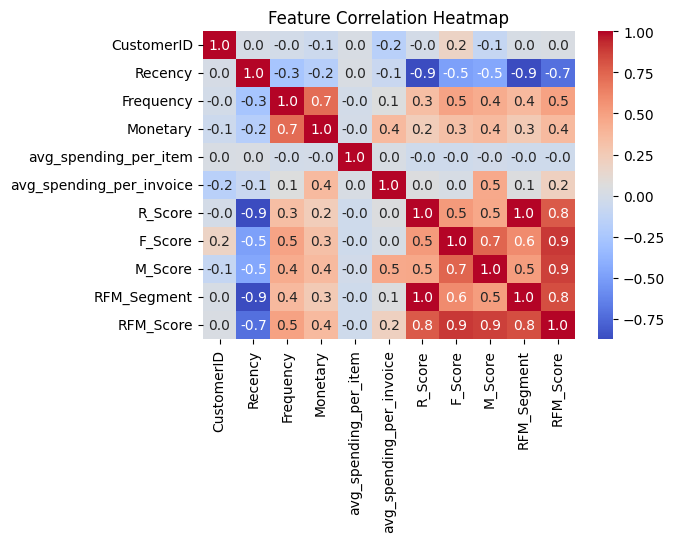

In [24]:
import seaborn as sns
import matplotlib.pyplot as plt
# Calculate the correlation matrix
correlation_matrix = rfm.corr()

# Plot the heatmap
plt.figure(figsize=(6, 4))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.1f')
plt.title("Feature Correlation Heatmap")
plt.show()

We are removing the following since they are highly correlated with most of the other features (bright red/blue):
* RFM_Segment
* RFM_Score
* R_Score
* F_Score
* M_Score

It makes sense the above have higher correlation with other features because they are derived from Recency, Frequency, and Monetary. Let's use the base to perform K-Means:
* Recency
* Frequency
* Monetary
* avg_spending_per_item
* avg_spending_per_invoice

### Perform K-Means

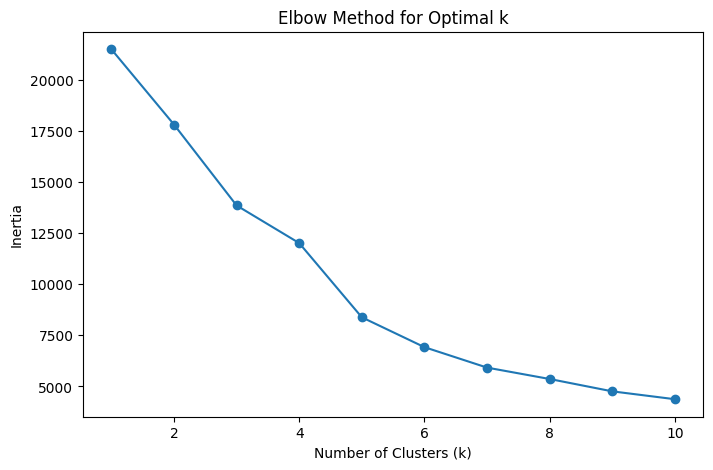

The optimal number of clusters (K) is: 5


In [25]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import numpy as np


# Selecting relevant features
features = ['Recency', 'Frequency', 'Monetary',
       'avg_spending_per_item', 'avg_spending_per_invoice']
X = rfm[features]

# Scale the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Determine optimal number of clusters using Elbow Method
inertia = []
k_range = range(1, 11)
for k in k_range:
    kmeans = KMeans(n_clusters=k, n_init='auto', random_state=42)
    kmeans.fit(X_scaled)
    inertia.append(kmeans.inertia_)

# Plot the Elbow Curve
plt.figure(figsize=(8, 5))
plt.plot(k_range, inertia, marker='o')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.show()

# Find the elbow point (where inertia decreases most slowly)
# Calculate the first derivative (differences between consecutive inertia values)
inertia_diff = np.diff(inertia)

# Calculate the second derivative (rate of change of the first derivative)
inertia_diff2 = np.diff(inertia_diff)

# Find the index where the second derivative is maximized (this is typically where the elbow is)
optimal_k = np.argmax(inertia_diff2) + 2  # +2 to account for the second derivative calculation

print(f"The optimal number of clusters (K) is: {optimal_k}")

# Apply K-Means with the chosen k (k = 5)
kmeans = KMeans(n_clusters=optimal_k, n_init='auto', random_state=42)
rfm['Cluster'] = kmeans.fit_predict(X_scaled)


In [26]:
rfm.columns

Index(['CustomerID', 'Recency', 'Frequency', 'Monetary',
       'avg_spending_per_item', 'avg_spending_per_invoice', 'R_Score',
       'F_Score', 'M_Score', 'RFM_Segment', 'RFM_Score', 'Cluster'],
      dtype='object')

In [27]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Group by Cluster and calculate metrics
cluster_stats = rfm.groupby('Cluster').agg(
    mean_spending_invoice=('avg_spending_per_invoice', 'mean'),
    mean_spending_item=('avg_spending_per_item', 'mean'),
    mean_frequency=('Frequency', 'mean'),
    mean_monetary=('Monetary', 'mean'),
    mean_recency=('Recency', 'mean'),
    count=('CustomerID', 'count')
).reset_index()

# Create the subplot layout
fig = make_subplots(
    rows=3, cols=2,  # 3 rows, 2 columns
    subplot_titles=(
        "Mean Spending Per Invoice", 
        "Mean Spending Per Item",
        "Mean Frequency", 
        "Mean Monetary",
        "Mean Recency", 
        "Customer Count"
    ),
    vertical_spacing=0.2,  # Spacing between rows
)

# Add horizontal bar charts for each metric with formatted text
metrics = [
    ('mean_spending_invoice', 'Mean Spending Per Invoice', 'skyblue', "${:.2f}"),
    ('mean_spending_item', 'Mean Spending Per Item', 'lightgreen', "${:.2f}"),
    ('mean_frequency', 'Mean Frequency', 'lightcoral', "{:.2f}"),
    ('mean_monetary', 'Mean Monetary', 'gold', "${:.2f}"),
    ('mean_recency', 'Mean Recency', 'purple', "{:.2f} days"),
    ('count', 'Customer Count', 'orange', "{:.0f}")
]

for idx, (col, title, color, format_str) in enumerate(metrics, start=1):
    row = (idx - 1) // 2 + 1
    col_idx = (idx - 1) % 2 + 1
    formatted_text = cluster_stats[col].apply(lambda x: format_str.format(x))
    fig.add_trace(
        go.Bar(
            x=cluster_stats[col],
            y=cluster_stats['Cluster'],
            name=title,
            orientation='h',
            marker_color=color,
            text=formatted_text,
            textposition="auto"
        ),
        row=row, col=col_idx
    )

# Update layout
fig.update_layout(
    title_text="Cluster Metrics Analysis",
    height=900,  # Adjust height for readability
    width=1000,  # Adjust width
    showlegend=False,
    margin=dict(l=40, r=40, t=40, b=40),  # Reduce margins
)

# Update axes for each subplot
for idx, (col, title, _, _) in enumerate(metrics, start=1):
    row = (idx - 1) // 2 + 1
    col_idx = (idx - 1) % 2 + 1
    fig.update_xaxes(title_text=title, row=row, col=col_idx)
    fig.update_yaxes(title_text="Cluster", row=row, col=col_idx)

# Show the plot
fig.show()


**Cluster 1 & 4: One-Time Buyers**  
- Customers in this group are mostly one-time buyers with low engagement.  
- Focus on converting them into repeat buyers by offering personalized incentives, such as exclusive discounts or limited-time offers. These customer groups on average spent more than 100 days ago. Try sending personalized messages to thank them for their purchase and encourage them to return, highlighting loyalty benefits.


However, we want to focus on the following three clusters: 

1st Priority >> 2nd Priority >> 3rd Priority

Cluster 2    >> Cluster 0    >> Cluster 3

> *SCORE of 1 is the highest, 3 is the lowest.*

**Cluster 2: Recent, Frequent, High-Spending Buyers**  
- **SCORE: Recency-1, Frequency-1, and Monetary-1**
- These are your best customers. They are recent, frequent, and high-spending.  
- Provide VIP treatment, such as early access to new products, exclusive offers, and invitations to special events. Strengthen their loyalty with top-tier service, personalized offers, and exclusive rewards.

**Cluster 0: Moderate Recency, Frequency, and Monetary**  
- **SCORE: Recency-2 (tie), Frequency-2, and Monetary-2**  
- These customers have moderate engagement but haven’t made a purchase in over a month.  
- Prioritize them after Cluster 2. Run win-back campaigns or offer targeted promotions to re-engage them, using personalized discounts or special offers to encourage repeat purchases.

**Cluster 3: Inactive, Mostly One-Time Buyers**  
- **SCORE: Recency-2 (tie), Frequency-3, and Monetary-3**  
- These customers have moderate engagement but haven’t made a purchase in over a month.  
- Prioritize them after Cluster 0. We can attract them with the same strategy as we re-engage Cluster 0. If there is a budget constraint, Cluster 0 has to be prioritized over this cluster.





## Apriori (Frequent Item Sets) and Association Rule


### Cluster Based Apriori and Association Rule

We will conduct Apriori and Association Rule for each cluster we get from the K-Means Model above. We have 5 clusters after removing outliers and running K-Means. 

Association rules can provide more personalized recommendations and therefore improve marketing and sales.

In [28]:
import pandas as pd
from mlxtend.frequent_patterns import apriori, association_rules
from mlxtend.preprocessing import TransactionEncoder

# Get cluster column
orders_cluster = pd.merge(orders_filtered, rfm[['CustomerID', 'Cluster']], how='inner',on='CustomerID')

# Get unique clusters in the table
clusters = orders_cluster['Cluster'].unique()

for cluster in clusters:
    # Filter based on cluster and sort based on invoice date
    subset_df = orders_cluster[orders_cluster['Cluster'] == cluster]
    subset_df = subset_df.sort_values(by='InvoiceDate', ascending=True)

    # Split into train and test
    # 80% train, 20% test
    split_ratio = 0.8
    split_point = int(len(subset_df['InvoiceNo'].unique()) * split_ratio)

    # Get unique TransactionIDs after sorting
    unique_transactions = subset_df['InvoiceNo'].unique()

    # Split the transactions into train and test sets based on the split point
    train_transaction_ids = unique_transactions[:split_point]
    test_transaction_ids = unique_transactions[split_point:]

    # Filter the DataFrame based on TransactionID
    train_transactions = subset_df[subset_df['InvoiceNo'].isin(train_transaction_ids)]
    test_transactions = subset_df[subset_df['InvoiceNo'].isin(test_transaction_ids)]
    # Identify customers who are present in both train and test datasets (FOR VALIDATION PURPOSES)
    common_customers = set(train_transactions['CustomerID']).intersection(set(test_transactions['CustomerID']))
    # Filter out transactions in train_df and test_df that belong to the common customers
    train_transactions = train_transactions[train_transactions['CustomerID'].isin(common_customers)]
    test_transactions = test_transactions[test_transactions['CustomerID'].isin(common_customers)]

    # Get a list of transactions per InvoiceNo
    train_transactions_list = train_transactions.groupby('InvoiceNo')['Description'].agg(list).values.tolist()


    # Step 1: Convert transaction data to one-hot encoding (basket)
    te = TransactionEncoder()
    te_ary = te.fit(train_transactions_list).transform(train_transactions_list)
    basket = pd.DataFrame(te_ary, columns=te.columns_)

    # Step 2: Apply Apriori algorithm to find frequent itemsets
    frequent_itemsets = apriori(basket, min_support=0.01, use_colnames=True)


    # Step 3: Generate association rules with a minimum threshold of 0.01
    print(f"Cluster {cluster}")
    if frequent_itemsets.empty:
        print("No recommended items.")
        continue
    rules = association_rules(frequent_itemsets, metric="confidence", min_threshold=0.01)

    # Function to normalize columns using Min-Max normalization
    def min_max_normalize(series):
        return (series - series.min()) / (series.max() - series.min())
    # Normalize the 'support', 'confidence', and 'lift'
    rules['support_normalized'] = min_max_normalize(rules['support'])
    rules['confidence_normalized'] = min_max_normalize(rules['confidence'])
    rules['lift_normalized'] = min_max_normalize(rules['lift'])
    # Calculate the combined score
    rules['combined_score'] = (rules['support_normalized']*60 + rules['confidence_normalized']*20 + rules['lift_normalized']*20)

    # Step 4: Creating recommendation for each customer in test set
    
    customer_recommendations = {}
    for customer in test_transactions['CustomerID'].unique():
        # Identify all items the customer purchased in the training set
        items_bought = train_transactions[train_transactions['CustomerID'] == customer]['Description'].unique()
        
        # Extract all rules relevant to these items
        rules_for_customer = rules[rules['antecedents'].apply(lambda x: not x.isdisjoint(items_bought))]
        
        # Rank the rules by their combined_score in descending order
        rules_for_customer = rules_for_customer.sort_values(by='combined_score', ascending=False)
        
        # Select the top 10 recommendations
        top_recommendations = rules_for_customer['consequents'].head(10)
        
        # Convert each frozenset in the recommendations to a regular list
        top_recommendations = [list(x) for x in top_recommendations]
        
        # Add the recommendations to our dictionary
        customer_recommendations[customer] = top_recommendations
        

    # Step 5: Validating the recommendation above
    # Initialize counts for TP, FP, FN, and total_hit
    tp = 0        # True Positives
    fp = 0        # False Positives
    fn = 0        # False Negatives
    total_hit = 0 # Total hit
    total_customers = len(test_transactions['CustomerID'].unique())

    # Evaluate each customer's recommendations
    for customer in test_transactions['CustomerID'].unique():
        actual_items = set(test_transactions[test_transactions['CustomerID'] == customer]['Description'].unique())
        recommended_items = set(item for sublist in customer_recommendations.get(customer, []) for item in sublist)

        hit = len(actual_items & recommended_items) > 0  # Hit is when at least 1 recommendation item bought

        if hit:  
            # Add total_hit
            total_hit += 1

        # True Positives: Items both recommended and purchased
        tp += len(recommended_items.intersection(actual_items))
        # False Positives: Items recommended but not purchased
        fp += len(recommended_items - actual_items)
        # False Negatives: Items purchased but not recommended
        fn += len(actual_items - recommended_items)

    # Calculate Precision, Recall, and optionally Accuracy
    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0
    accuracy = total_hit / total_customers # This is a simplified accuracy measure
    # Calculate F1 Score
    if precision + recall > 0:
        f1_score = 2 * (precision * recall) / (precision + recall)
    else:
        f1_score = 0

    print(f"Precision: {precision:.2f}")
    print(f"Recall: {recall:.2f}")
    print(f"F1-Score: {f1_score:.2f}")
    print(f"Hit Rate (at least 1 hit): {accuracy:.2f}")


Cluster 1
Precision: 0.09
Recall: 0.04
F1-Score: 0.05
Hit Rate (at least 1 hit): 0.35
Cluster 3
Precision: 0.15
Recall: 0.03
F1-Score: 0.06
Hit Rate (at least 1 hit): 0.47
Cluster 0
Precision: 0.26
Recall: 0.03
F1-Score: 0.05
Hit Rate (at least 1 hit): 0.62
Cluster 2
Precision: 0.33
Recall: 0.01
F1-Score: 0.01
Hit Rate (at least 1 hit): 0.68
Cluster 4
No recommended items.


If we take an average of all accuracy, we get **53%** of the customers purchasing at least 1 recommended item.